In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/home/fl350/.pyenv/versions/2.7.11/envs/jupyter/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['text', 'repeat', 'bar', 'test']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [38]:
from music21 import *
import seaborn as sns
import pandas as pd
from matplotlib import gridspec
import h5py
import json

import sys
sys.path.append('/home/fl350/bachbot/scripts')
from constants import *

In [153]:
utf_to_txt = json.load(open('/home/fl350/bachbot/scratch/utf_to_txt.json'))
txt_to_utf = { v:k for k,v in utf_to_txt.items() }

checkpoint_fp = '/home/fl350/bachbot/best_model/checkpoint_200'
params = json.load(open(checkpoint_fp + '.json', 'r'))
vocabs = json.load(open(params['opt']['input_json'], 'r'))
vocab_size = len(vocabs['token_to_idx'])

In [154]:
fp = '/home/fl350/data/embed/input.h5'
input_data = h5py.File(fp)[fp].value.T
is_chord_bdy = input_data ==  vocabs['token_to_idx'][txt_to_utf[CHORD_BOUNDARY_DELIM]]

In [155]:
def pool_matrix(mat, row_to_bin):
    "Pools the rows of `mat` using row_to_order"
    pooled = np.zeros((len(set(row_to_bin.values())), mat.shape[1]))
    for row_idx in range(mat.shape[0]):
        pooled[row_to_bin[row_idx],:] += mat[row_idx,:]
    return pooled

In [156]:
# Computes `tuples_by_pitch` for pooling rows in piano roll
special_texts = [CHORD_BOUNDARY_DELIM, FERMATA_SYM, 'START', 'END']

tuples_by_pitch = sorted(
    filter(
        lambda x: x[0] not in special_texts,
        map(lambda x: (utf_to_txt[x[0]], x[1]-1), # convert to 0-index b/c will be used for indexing numpy rows
            vocabs['token_to_idx'].items())),
    key=lambda x: eval(x[0])[0])

row_to_order_idx = dict()
prev_midi = -1
curr_idx = 0
for t,idx in tuples_by_pitch:
    midi_val, _ = eval(t)
    row_to_order_idx[idx] = curr_idx
    if midi_val != prev_midi:
        curr_idx += 1
    prev_midi = midi_val
    
for i,txt in enumerate(special_texts):
    idx = curr_idx + i
    row_to_order_idx[vocabs['token_to_idx'][txt_to_utf[txt]]-1] = idx
    
assert set(range(vocab_size)) == set(row_to_order_idx)
assert set(row_to_order_idx.values()) == set(range(len(set(row_to_order_idx.values()))))

### The test score used as network input

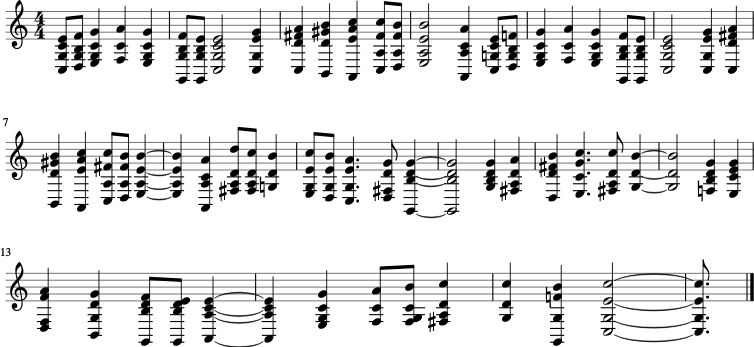

In [157]:
s = midi.translate.midiFileToStream(
        midi.translate.streamToMidiFile(
            converter.parseFile('/home/fl350/data/embed/input.xml')))
s.show()

### Activations/Cell state visualizations

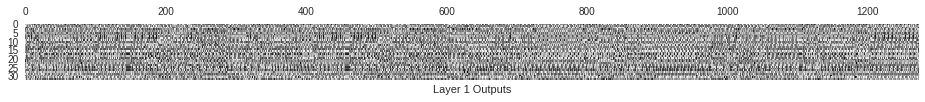

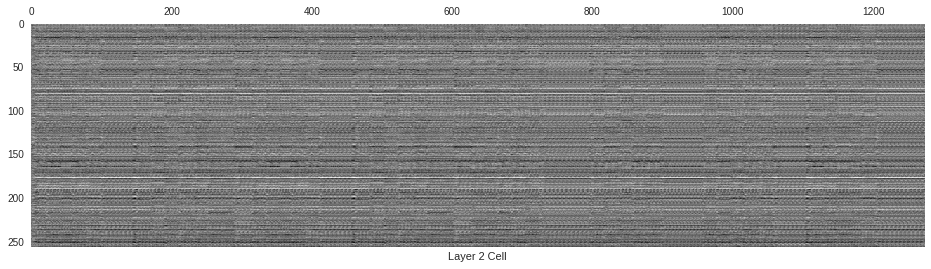

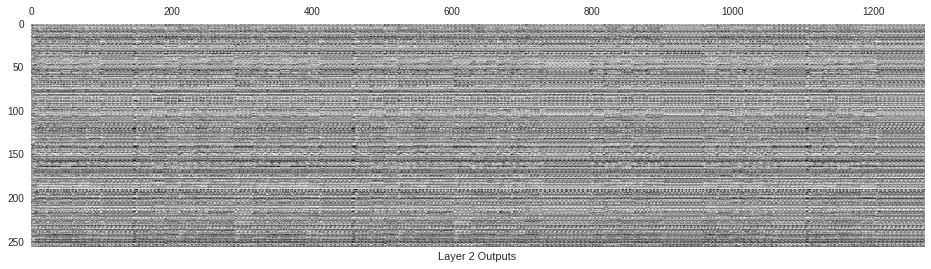

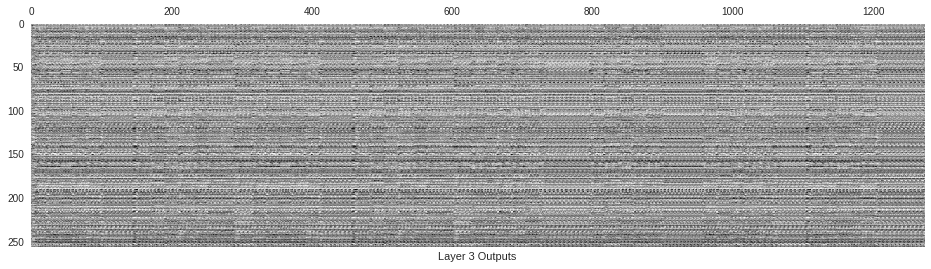

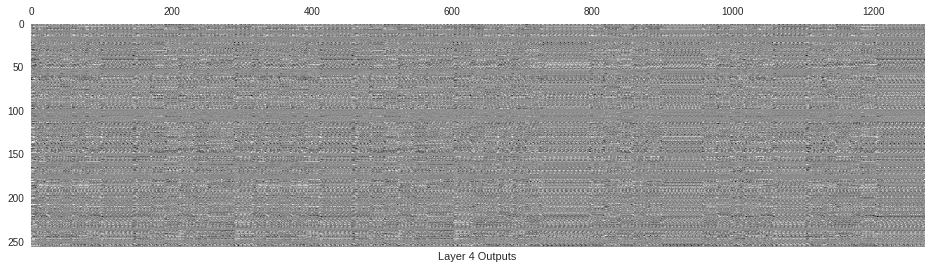

...

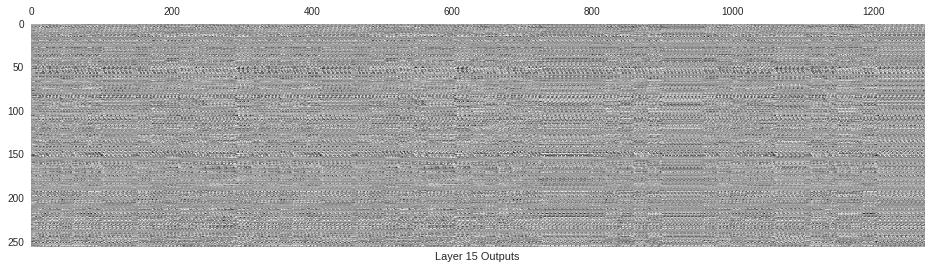

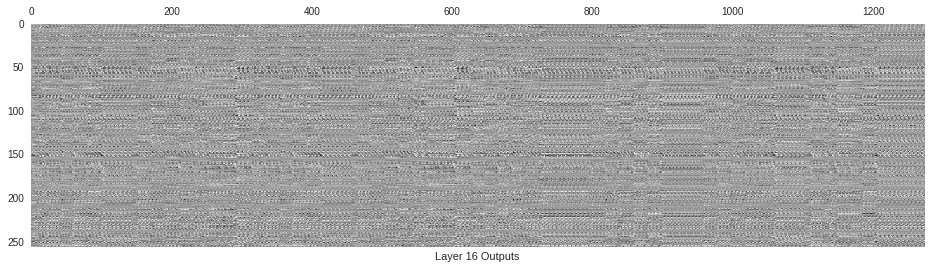

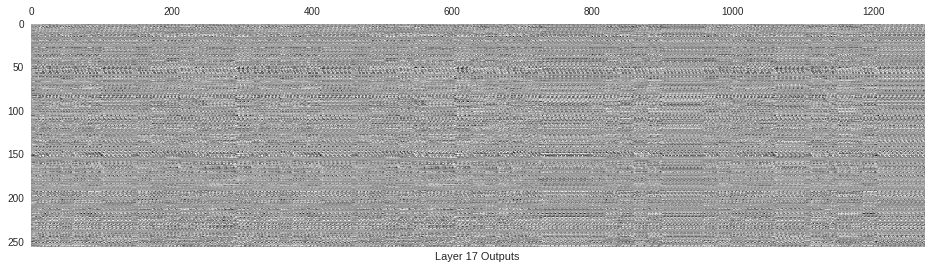

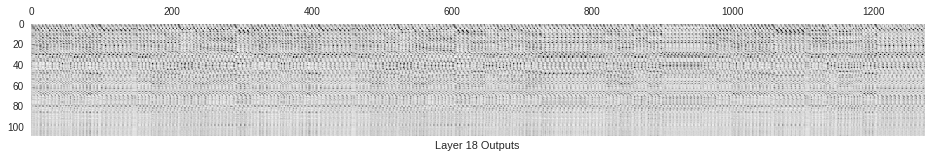

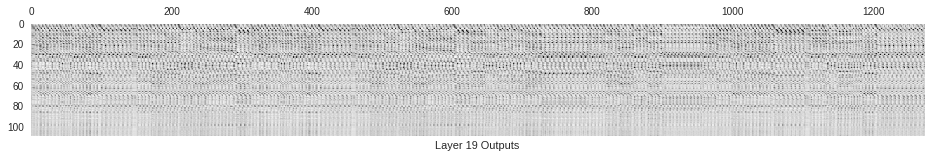

In [102]:
num_layers = 19

for layer in range(1,num_layers+1):
    fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
    
    cell_fp = os.path.dirname(fp) + '/cell-{}.h5'.format(layer)
    if os.path.exists(cell_fp):
        ds = h5py.File(cell_fp)[cell_fp].value.T
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.xlabel('Layer {} Cell'.format(layer))
            plt.show()

    ds = h5py.File(fp)[fp].value.T
    with sns.axes_style('dark'):
        plt.figure(num=1, figsize=(16,np.ceil(ds.shape[0] * 4. / 300.)))
        plt.matshow(ds, fignum=1, aspect='auto')
        plt.xlabel('Layer {} Outputs'.format(layer))
        plt.show()        

### Pooled over frames (i.e. one step in x-axis corresponds to 1/16th note)

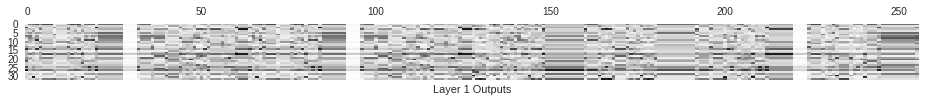

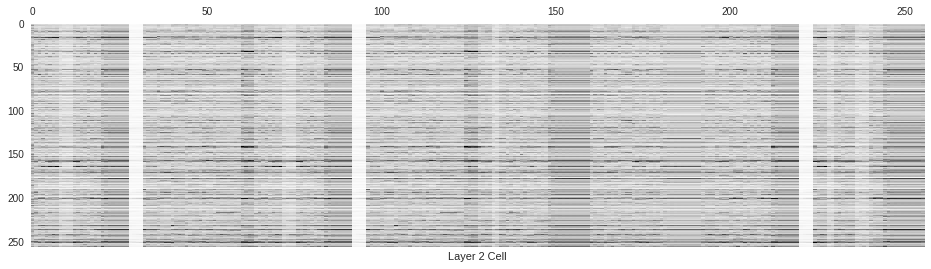

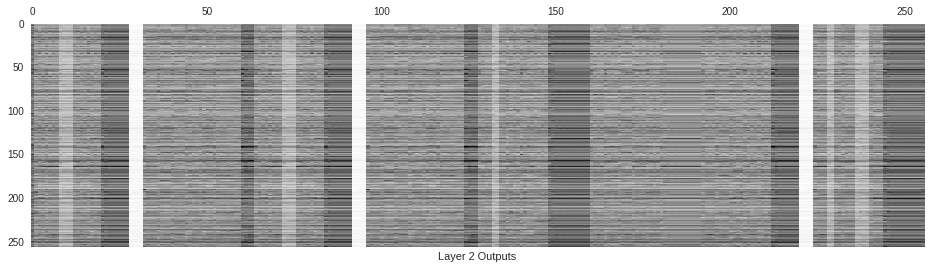

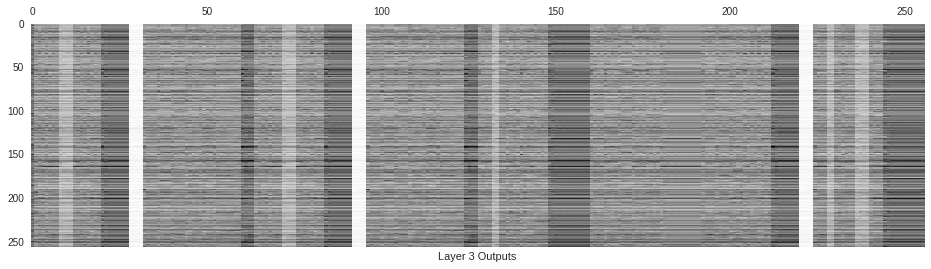

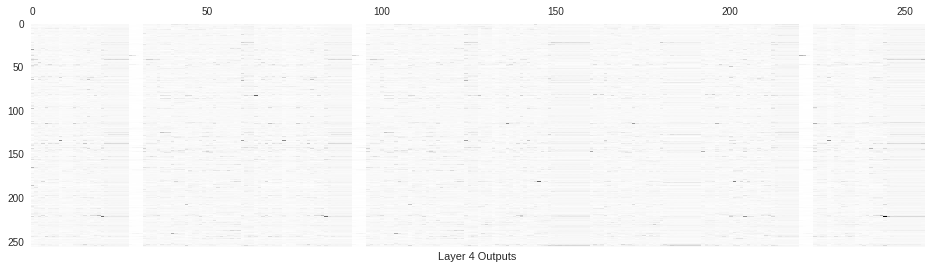

...

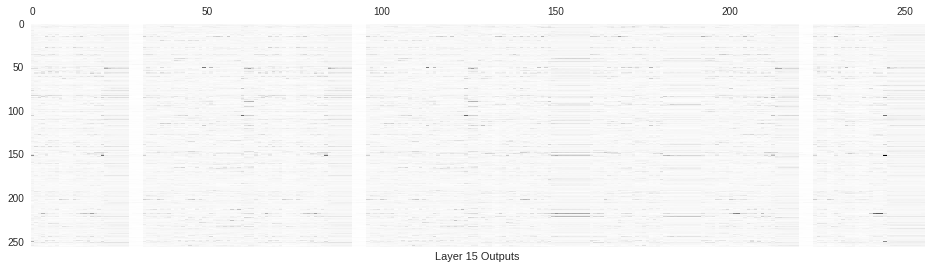

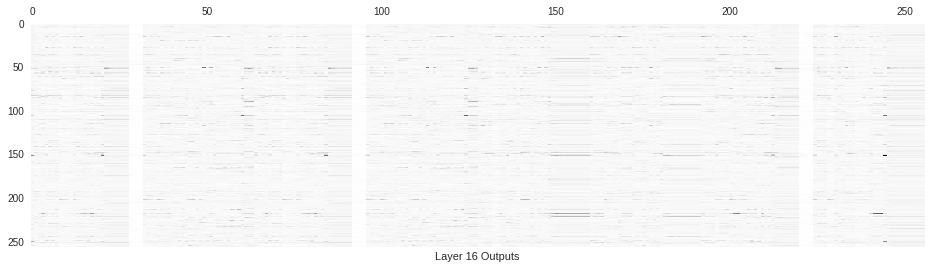

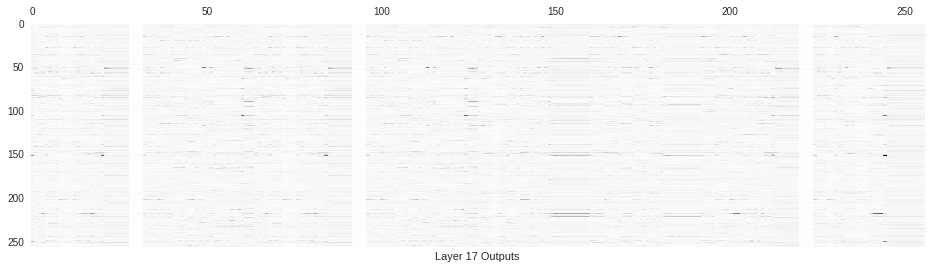

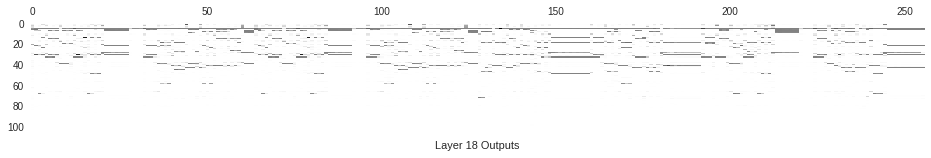

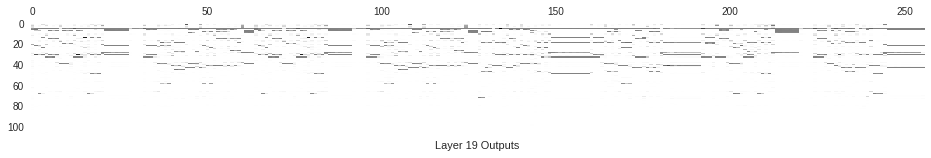

In [174]:
num_layers = 19

for layer in range(1,num_layers+1):
    fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
    
    cell_fp = os.path.dirname(fp) + '/cell-{}.h5'.format(layer)
    if os.path.exists(cell_fp):
        ds = h5py.File(cell_fp)[cell_fp].value.T
        ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.xlabel('Layer {} Cell'.format(layer))
            plt.show()

    ds = h5py.File(fp)[fp].value.T
    ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
    with sns.axes_style('dark'):
        plt.figure(num=1, figsize=(16,np.ceil(ds.shape[0] * 4. / 300.)))
        plt.matshow(ds, fignum=1, aspect='auto')
        plt.xlabel('Layer {} Outputs'.format(layer))
        plt.show()        

### Confirm that final outputs correspond to a piano roll

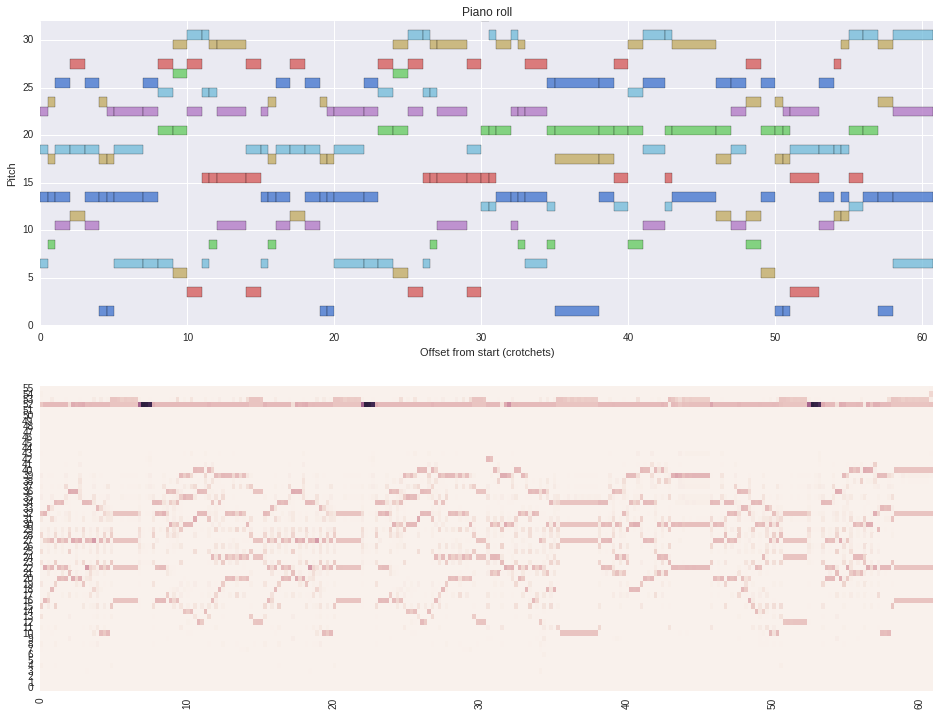

In [158]:
with sns.axes_style("darkgrid"):
    fig, (ax1, ax2) = plt.subplots(2,1)

g = graph.PlotHorizontalBarPitchSpaceOffset(s)
data, xTicks, _ = g._extractData()

yPos = 0
xPoints = [] # store all to find min/max
yTicks = [] # a list of label, value pairs

colors = sns.color_palette("muted")

keys = []
i = 0
for i, (key, points) in enumerate(data):
    keys.append(key)
    if len(points) > 0:
        yrange = (yPos + 1, 1)
        ax1.broken_barh(points,
                        yrange,
                        facecolor=colors[i%len(colors)],
                        alpha=0.8)
        for xStart, xLen in points:
            xEnd = xStart + xLen
            for x in [xStart, xEnd]:
                if x not in xPoints:
                    xPoints.append(x)
    yTicks.append([yPos + 1 * .5, key])
    yPos += 1
    i += 1

xMin = min(xPoints)
xMax = max(xPoints) 

ax1.set_ylim(0, len(keys) * 1)
ax1.set_xlim(xMin, xMax)
ax1.set_yticks(*zip(*yTicks))
ax1.set_xticks(*zip(*xTicks))
ax1.set_title('Piano roll')
ax1.set_xlabel('Offset from start (crotchets)')
ax1.set_ylabel('Pitch')

layer = 19
fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
ds = h5py.File(fp)[fp].value.T

def pool_chords(ds, is_chord_bdy, softmax_before_pool=False):
    """
    Computes token probabilities and pools across chords. Useful for making dim 2 correspond to time.
    """
    pooled_probs = np.zeros((ds.shape[0], is_chord_bdy.sum()+1))
    curr_chord_idx = 0
    for i in range(is_chord_bdy.size):
        if softmax_before_pool:
            pooled_probs[:,curr_chord_idx] += (np.exp(ds[:,i]) / sum(np.exp(ds[:,i])))
        else:
            pooled_probs[:,curr_chord_idx] += ds[:,i]
        if is_chord_bdy[i,0]:
            curr_chord_idx += 1            
    return pooled_probs

pooled_probs = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
        
mat_z = pool_matrix(pooled_probs[:,:], row_to_order_idx) # combine articulated/unarticulated
mat_p = mat_z / mat_z.sum(0) # normalize
#mat_p = np.exp(mat_z) / np.exp(mat_z).sum(0)

#ax2.matshow(mat_p, aspect='auto', interpolation='none')
sns.heatmap(mat_p, ax=ax2, cbar=False)

ax2.invert_yaxis()
ax2.set_xticks(np.arange(0,mat_z.shape[1],42))
ax2.set_xticklabels(np.arange(0, mat_z.shape[1]/4, 10))
#ax2.set_title('Probabilistic piano roll predictions for next chords')

fig.set_size_inches((16,12))
fig.show()

## Look at neuron activations

This LSTM 3 neuron exhibits spiking when a chord is held for >= 2 bars?

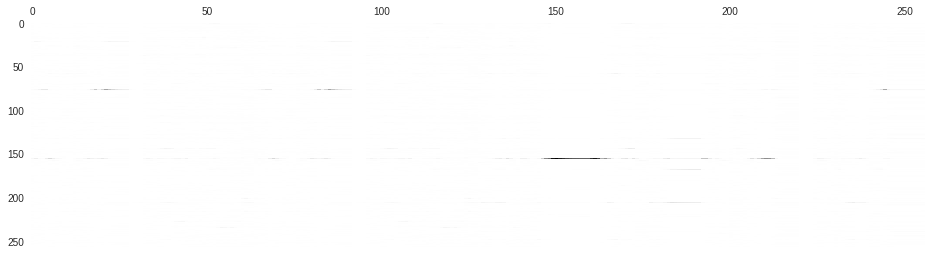

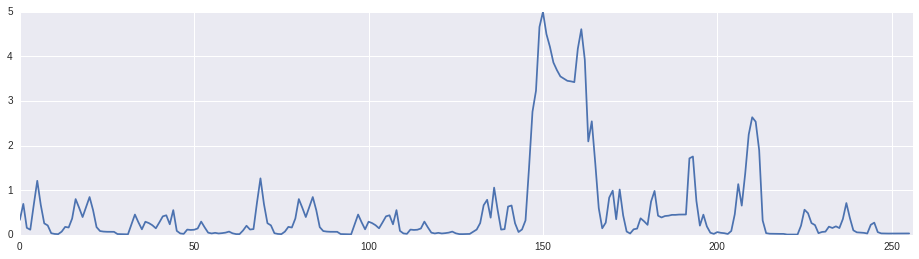

In [163]:
fp = '/home/fl350/data/embed/cell-12.h5'
ds = h5py.File(fp)[fp].value.T
ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
with sns.axes_style('dark'):
    plt.figure(num=1, figsize=(16,4))
    plt.matshow(ds, fignum=1, aspect='auto')
    plt.show()

ds_neuron = ds[155:156,:].T
plt.figure(figsize=(16,4))
plt.plot(ds_neuron)
plt.xlim(xmax=ds_neuron.size)
plt.show()

This neuron spikes whenever a cadence occurs

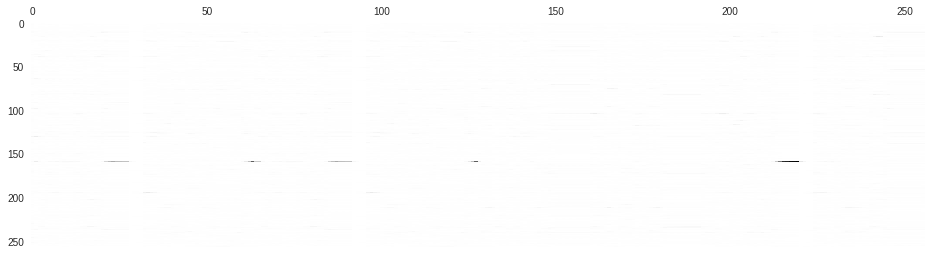

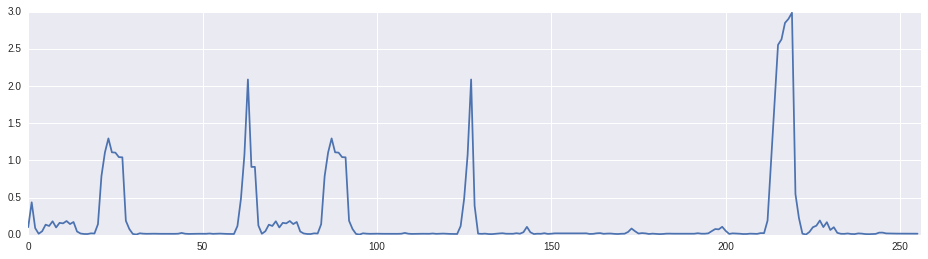

In [170]:
fp = '/home/fl350/data/embed/cell-7.h5'
ds = h5py.File(fp)[fp].value.T
ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
with sns.axes_style('dark'):
    plt.figure(num=1, figsize=(16,4))
    plt.matshow(ds, fignum=1, aspect='auto')
    plt.show()

ds_neuron = ds[158:159,:].T
plt.figure(figsize=(16,4))
plt.plot(ds_neuron)
plt.xlim(xmax=ds_neuron.size)
plt.show()